## Importar las librerias necesarias

<p>Para esta parte del proyecto que se denominara EDA(Exploratory Data Analysis), se usaran las herramientas de las librerias <strong> pandas, ydata-profiling, wrangler, matplotlib y seaborn, </strong>con el fin de analizar de manera detallada los datos que se usaran en el entrenamiento del modelo. Estos datos que han sido preparados en la instancia anterior llamada ETL y almacenados en una base de datos SQLite seran cargados a traves de una conexion realizada con la libreria <strong>sqlalchemy</strong>.</p>

### Importar las librerias a usar.

In [1]:
# Librerias a utilizar durante los procesos.
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
from ydata_profiling import ProfileReport
from sqlalchemy import create_engine
from wordcloud import WordCloud

%matplotlib inline

### Conexion a la base de datos.

In [2]:
# Conexion a la base de datos.
engine = create_engine('sqlite:///../API/data/movies.db')

> Con el fin de analizar los datos almacenados se realiza una conexion a la base de datos.

## Importar datos de la base de datos.

In [3]:
# Crear Dataframe directors con los datos.
directors = pd.read_sql('unique_directors', engine)
directors


,director_id,name
0,4463,aamir khan
1,5020,aarne tarkas
2,5480,aaron aites
3,16023,aaron biebert
4,2772,aaron blaise
...,...,...
16631,12146,zoltan spirandelli
16632,11283,zoran lisinac
16633,5792,zoya akhtar
16634,14042,zrinko ogresta


> una vez importado los datos se agrega a la tala un nuevo registro 'desconocido', con el fin de unir las tablas y aquellas peliculas que no cuenten con un director se le agregara el valor de 'desconocido'.

In [4]:
# Obtener el id maximo para tener una referencia y crear el registro de director desconocido.
directors['director_id'].max()

np.int64(16636)

In [5]:
# Crear registro de director desconocido en directors.
directors.loc[16637] = [99999, 'desconocido']

In [6]:
# Verificar el nuevo dato.
directors_ = directors[directors['name'] == 'desconocido']
directors_

,director_id,name
16637,99999,desconocido


### Cargar tabla de peliculas.

In [7]:
# Crear Dataframe movie con los registros de las peliculas.
movies = pd.read_sql_table('movie', engine)
movies

,budget,movie_id,original_language,overview,popularity,release_date,revenue,runtime,title,vote_average,vote_count,genres_clean,production_companies_clean,production_countries_clean,retorno_de_inversion,release_year,director_id
0,0.0,2,fi,Taisto Kasurinen is a Finnish coal miner whose...,3.860491,1988-10-21,0.0,69.0,ariel,7.1,44.0,"Drama, Crime","Villealfa Filmproduction Oy, Finnish Film Foun...",Finland,0.000000,1988,NaN
1,0.0,3,fi,"An episode in the life of Nikander, a garbage ...",2.292110,1986-10-16,0.0,76.0,shadows in paradise,7.1,35.0,"Drama, Comedy",Villealfa Filmproduction Oy,Finland,0.000000,1986,NaN
2,4000000.0,5,en,It's Ted the Bellhop's first night on the job....,9.026586,1995-12-09,4300000.0,98.0,four rooms,6.5,539.0,"Crime, Comedy","Miramax Films, A Band Apart",United States of America,1.075000,1995,18.0
3,0.0,6,en,"While racing to a boxing match, Frank, Mike, J...",5.538671,1993-10-15,12136938.0,110.0,judgment night,6.4,79.0,"Action, Thriller, Crime","Universal Pictures, Largo Entertainment, JVC E...","Japan, United States of America",0.000000,1993,348.0
4,11000000.0,11,en,Princess Leia is captured and held hostage by ...,42.149697,1977-05-25,775398007.0,121.0,star wars,8.1,6778.0,"Adventure, Action, Science Fiction","Lucasfilm, Twentieth Century Fox Film Corporation",United States of America,70.490728,1977,228.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31943,0.0,464111,en,"Stranded in an Arctic mine, two survivors are ...",3.214001,2017-07-12,0.0,23.0,zygote,7.2,28.0,"Horror, Science Fiction",Oats Studio,Canada,0.000000,2017,5076.0
31944,0.0,464207,en,"William Shatner sits down with scientists, inn...",1.075249,2017-05-01,0.0,86.0,the truth is in the stars,7.5,2.0,Documentary,NoData,Canada,0.000000,2017,16489.0
31945,0.0,465044,en,A horror comedy spoofing conspiracy theory mov...,0.281008,2017-06-28,0.0,90.0,abduction,0.0,0.0,"Fantasy, Drama",NoData,United Kingdom,0.000000,2017,16486.0
31946,0.0,467731,en,Fifteen-year-old girl Dotty Fisher is assaulte...,0.001189,1956-02-19,0.0,60.0,tragedy in a temporary town,0.0,0.0,Drama,NoData,United States of America,0.000000,1956,373.0


In [8]:
# Reemplazar valores nulos con el id 99999
movies['director_id'] = movies['director_id'].fillna(99999)

> Mediante el metodo fillna se agregan en los valores nulos el id 99999 que pertenece al registro 'desconocido' creado previamente. 

In [9]:
# Verificar los registros de la tabla.
null =movies[movies['director_id'] == 99999]
null

,budget,movie_id,original_language,overview,popularity,release_date,revenue,runtime,title,vote_average,vote_count,genres_clean,production_companies_clean,production_countries_clean,retorno_de_inversion,release_year,director_id
0,0.0,2,fi,Taisto Kasurinen is a Finnish coal miner whose...,3.860491,1988-10-21,0.0,69.0,ariel,7.1,44.0,"Drama, Crime","Villealfa Filmproduction Oy, Finnish Film Foun...",Finland,0.000000,1988,99999.0
1,0.0,3,fi,"An episode in the life of Nikander, a garbage ...",2.292110,1986-10-16,0.0,76.0,shadows in paradise,7.1,35.0,"Drama, Comedy",Villealfa Filmproduction Oy,Finland,0.000000,1986,99999.0
22,2000000.0,55,es,Three different people in Mexico City are cata...,5.958138,2000-06-16,20908467.0,154.0,amores perros,7.6,537.0,"Drama, Thriller","Altavista Films, Zeta Film",Mexico,10.454234,2000,99999.0
25,9285469.0,64,es,Two men share an odd friendship while they car...,6.648278,2002-03-14,51001550.0,112.0,talk to her,7.5,273.0,"Drama, Romance","Vía Digital, Good Machine, El Deseo S.A., Ante...",Spain,5.492620,2002,99999.0
28,0.0,67,en,Paradise Now is filmed from the perspective of...,3.714186,2005-02-14,3357075.0,90.0,paradise now,6.9,63.0,"Thriller, Crime, Drama","Lama Films, Augustus Film, Lama Productions, L...","Palestinian Territory, France, Germany, Israel...",0.000000,2005,99999.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31915,0.0,455363,en,A behind-the-scenes look at the building of th...,0.001178,1958-01-01,0.0,6.0,the rise and fall of a jungle giant,0.0,0.0,Documentary,NoData,United States of America,0.000000,1958,99999.0
31920,0.0,456018,en,Two chefs in DC struggle to open and maintain ...,0.032991,2016-03-05,0.0,96.0,new chefs on the block,0.0,0.0,NoData,NoData,NoData,0.000000,2016,99999.0
31930,0.0,460024,en,After a night out of partying and left behind ...,6.868237,2017-06-02,0.0,84.0,stasis,4.0,37.0,"Adventure, Science Fiction","Vangard Productions, PraxiScope Productions",United States of America,0.000000,2017,99999.0
31934,0.0,461533,en,"Interviews about the film ""Meanwhile"" with dir...",0.010588,2013-04-23,0.0,15.0,the everyday,0.0,0.0,Documentary,Possible Films,United States of America,0.000000,2013,99999.0


> se verifican los datos que contienen el registro 999999 en director_id de la tabla movie y se evalua que todo vaya bien.

### Merge de tablas.

In [10]:
# Merge de tablas mediante el director_id
data = pd.merge(movies,directors, on='director_id', how='inner')
data

,budget,movie_id,original_language,overview,popularity,release_date,revenue,runtime,title,vote_average,vote_count,genres_clean,production_companies_clean,production_countries_clean,retorno_de_inversion,release_year,director_id,name
0,0.0,2,fi,Taisto Kasurinen is a Finnish coal miner whose...,3.860491,1988-10-21,0.0,69.0,ariel,7.1,44.0,"Drama, Crime","Villealfa Filmproduction Oy, Finnish Film Foun...",Finland,0.000000,1988,99999.0,desconocido
1,0.0,3,fi,"An episode in the life of Nikander, a garbage ...",2.292110,1986-10-16,0.0,76.0,shadows in paradise,7.1,35.0,"Drama, Comedy",Villealfa Filmproduction Oy,Finland,0.000000,1986,99999.0,desconocido
2,4000000.0,5,en,It's Ted the Bellhop's first night on the job....,9.026586,1995-12-09,4300000.0,98.0,four rooms,6.5,539.0,"Crime, Comedy","Miramax Films, A Band Apart",United States of America,1.075000,1995,18.0,allison anders
3,0.0,6,en,"While racing to a boxing match, Frank, Mike, J...",5.538671,1993-10-15,12136938.0,110.0,judgment night,6.4,79.0,"Action, Thriller, Crime","Universal Pictures, Largo Entertainment, JVC E...","Japan, United States of America",0.000000,1993,348.0,stephen hopkins
4,11000000.0,11,en,Princess Leia is captured and held hostage by ...,42.149697,1977-05-25,775398007.0,121.0,star wars,8.1,6778.0,"Adventure, Action, Science Fiction","Lucasfilm, Twentieth Century Fox Film Corporation",United States of America,70.490728,1977,228.0,george lucas
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31943,0.0,464111,en,"Stranded in an Arctic mine, two survivors are ...",3.214001,2017-07-12,0.0,23.0,zygote,7.2,28.0,"Horror, Science Fiction",Oats Studio,Canada,0.000000,2017,5076.0,neill blomkamp
31944,0.0,464207,en,"William Shatner sits down with scientists, inn...",1.075249,2017-05-01,0.0,86.0,the truth is in the stars,7.5,2.0,Documentary,NoData,Canada,0.000000,2017,16489.0,craig thompson
31945,0.0,465044,en,A horror comedy spoofing conspiracy theory mov...,0.281008,2017-06-28,0.0,90.0,abduction,0.0,0.0,"Fantasy, Drama",NoData,United Kingdom,0.000000,2017,16486.0,molly smith
31946,0.0,467731,en,Fifteen-year-old girl Dotty Fisher is assaulte...,0.001189,1956-02-19,0.0,60.0,tragedy in a temporary town,0.0,0.0,Drama,NoData,United States of America,0.000000,1956,373.0,sidney lumet


> se realiza un merge de las tablas para poder unificarlas y tener todos los registros en una sola y facilitar los posteriores analisis, dejando un total de 31948 registros con 18 variables en total.

### Aplicacion de librerias como Ydata-profiling y Wrangler para el analisis detallado de los datos.

In [11]:
ydata = ProfileReport(data)
# datos.to_file("movies_data.html")
ydata



Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Analisis preliminar.

<p>Al detallar las diferentes variables se pueden contemplar los siguientes aspectos:<br>
<ul>
    <ul><strong>Variables que representan ID:</strong>
        <li>
            movie_id
        </li>
        <li>
            director_id
        </li>
    </ul>
    <ul><strong>variables con filas que tienen un valor = 0 que representan mas del 75% de los datos:</strong>
        <li>
            budget 77% de los datos es igual a 0 
        </li>
        <li>
            revenue el 81% de los datos es igual a 0
        </li>
        <li>
            retorno_de_inversion 86% de los datos es igual a 0
        </li>
    </ul>
      <ul><strong>variable que representa una fecha:</strong>
        <li>
            release_date (Fecha de lanzamiento)
        </li>
        <li>
            release_year (año de lanzamiento)
        </li>
    </ul>       
</ul>

> Tomando en cuenta este primer analisis se puede deducir lo siguiente con respecto a cada grupo de variables.<hr>
<p>En el primer grupo de variables '<strong>Variables que representan ID:</strong>' se cuentan con variables de identificacion unica 'id' que no aportarian valor categorico al modelo a entrenar y que por el contrario complejizarian al modelo de manera redundante e inecesaria.</p><hr>
<p>En el segundo grupo de variables '<strong>variables con filas que tienen un valor = 0 que representan mas del 75% de los datos:</strong>' se puede contemplar un gran numero de datos con valor de 0(cero) que superan el tercio del total de los datos (75% en adelante), lo que representaria un problema para intentar realizar un tratamiento adecuado para mantener dichas columnas y de mantenerse generarian algun tipo de imprecision durante el entrenamiento del modelo a utilizar</p><hr>
<p>En el tercer grupo de variables '<strong>variable que representa una fecha:</strong>' se puede contemplar un gran numero de datos con valor de 0(cero) que superan el tercio del total de los datos (75% en adelante), lo que representaria un problema para intentar realizar un tratamiento adecuado para mantener dichas columnas y de mantenerse generarian algun tipo de imprecision durante el entrenamiento del modelo a utilizar</p><hr>


## Diagrama de variable budget

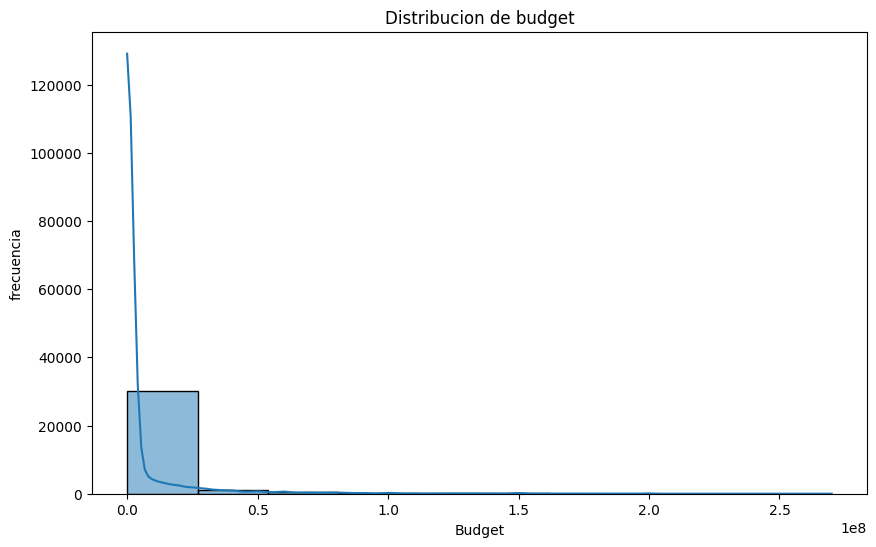

In [12]:
# Matploitlib para visualizar la frecuencia de los datos y la pendiente que representa.
plt.figure(figsize=(10, 6))
sns.histplot(data['budget'], bins=10, kde=True)
plt.xlabel('Budget')
plt.ylabel('frecuencia')
plt.title('Distribucion de budget')
plt.show()


## Diagrama de variable Retorno de Inversion

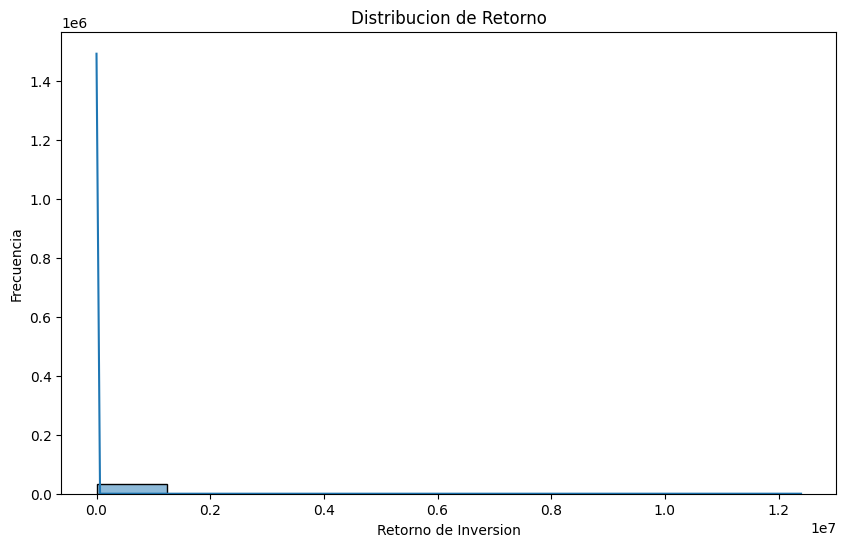

In [13]:
# Matploitlib para visualizar la frecuencia de los datos y la pendiente que representa.
plt.figure(figsize=(10, 6))
sns.histplot(data['retorno_de_inversion'], bins=10, kde=True)
plt.xlabel('Retorno de Inversion')
plt.ylabel('Frecuencia')
plt.title('Distribucion de Retorno')
plt.show()


## Variable revenue

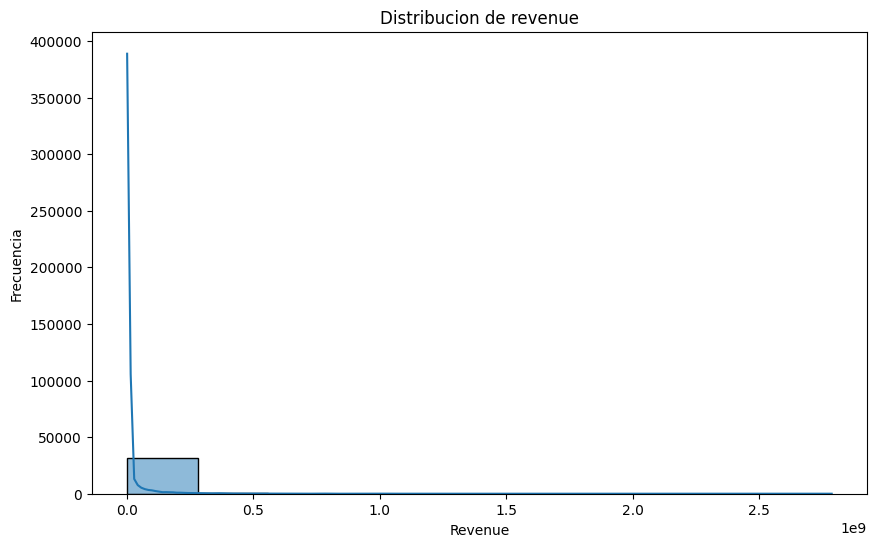

In [14]:
# Matploitlib para visualizar la frecuencia de los datos y la pendiente que representa.
plt.figure(figsize=(10, 6))
sns.histplot(data['revenue'], bins=10, kde=True)
plt.xlabel('Revenue')
plt.ylabel('Frecuencia')
plt.title('Distribucion de revenue')
plt.show()

## Drop de columnas.

In [15]:
colum_drop = ['revenue', 'budget','movie_id','director_id','release_date', 'release_year','runtime','retorno_de_inversion']
data =data.drop(columns= colum_drop)

## Analisis de las variables numericas.

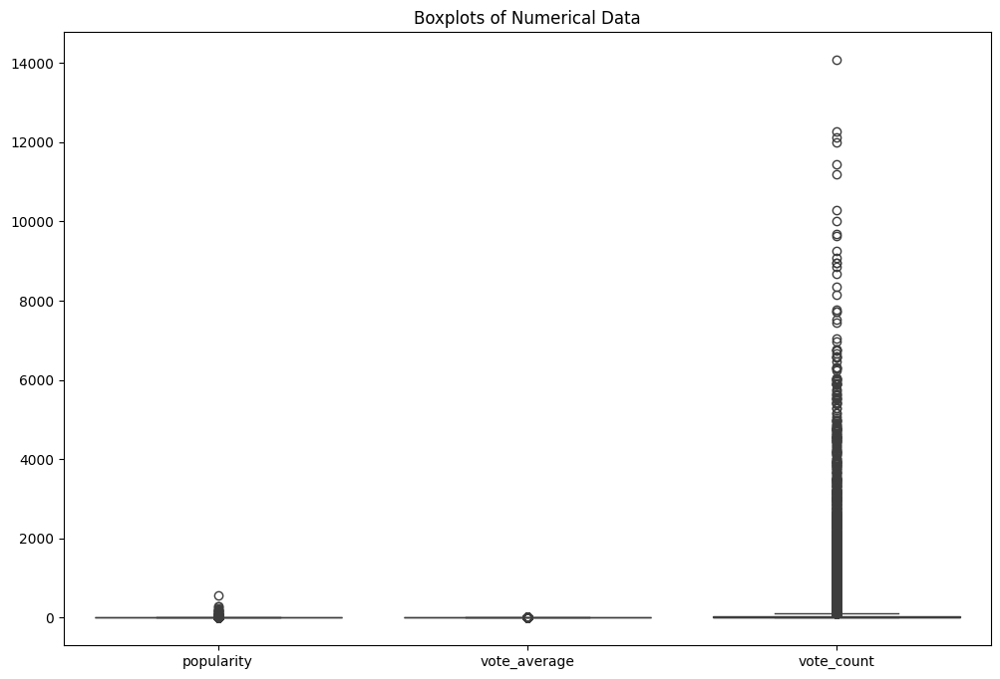

In [16]:
# Crear boxplots para cada columna numérica

plt.figure(figsize=(12, 8))
sns.boxplot(data=data)
plt.title('Boxplots of Numerical Data')
plt.show()

> En la evaluacion de Vote_count los datos se encuentran bastante dispersis en comparacion con los datos de popularity y vote_average, vote_average al ser un promedio de vote_count no se tomaran en cuenta, dejando solo una variable numerica, a considerar, teniendo esto en cuenta se decide trabajar unicamente con las variables categoricas y emplear un procesamiento de texto unicamente para las recomendaciones ya que solo se estara pasando el titulo de la pelicula y nada mas para las consultas y las sugerencias.

In [17]:
colum_drop = ['popularity', 'vote_average', 'vote_count']
data =data.drop(columns= colum_drop)

## Analisis de las variables categoricas.

<p> En el siguiente bloque se representara de manera grafica el comportamiento de las palabras que se incluyen dentro del data set </p>

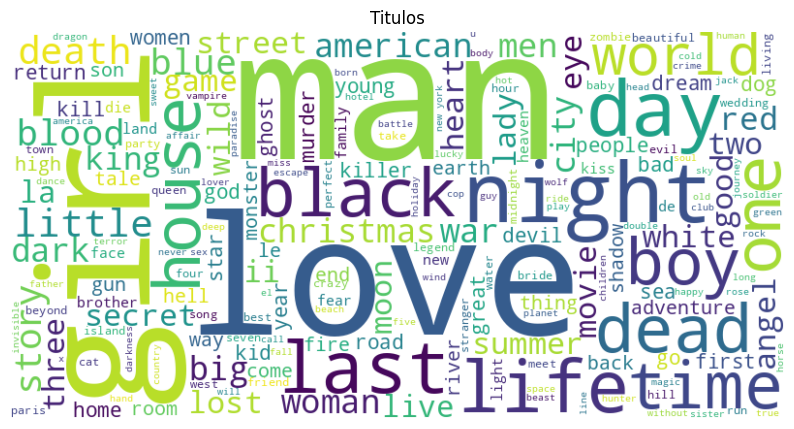

In [18]:
# convertir en una cadena de texto la columna para procesarla con wordcloud
text = ' '.join(data['title'].tolist())

# procesamiento con wordcloud para poder graficarla
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

# Mostrar la nube de palabras usando Matplotlib
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Titulos')
plt.show()

> En todo nuestro conjunto de datos los titulos que mayor resaltan son los que contienen las palabras man, love, girl respectivamente.

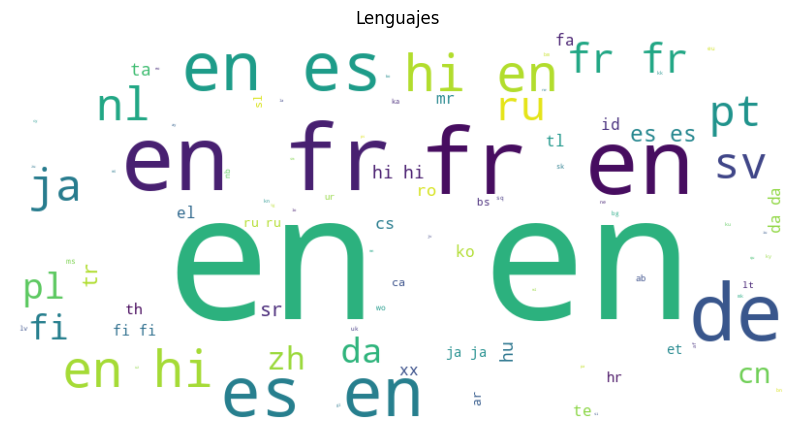

In [19]:
text = ' '.join(data['original_language'].tolist())

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

# Mostrar la nube de palabras usando Matplotlib
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Lenguajes')
plt.show()

> Se tienen un total de 84 codigos de lenguajes en todo el conjunto de datos, dejandonos con que la mayor cantidad de las peliculas en su lenguaje original se encuentra en ingles seguido del frances y el español.

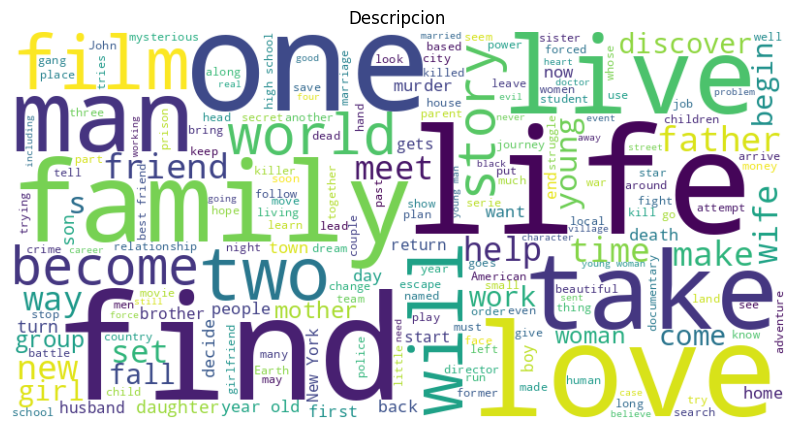

In [20]:
text = ' '.join(data['overview'].tolist())

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

# Mostrar la nube de palabras usando Matplotlib
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Descripcion')
plt.show()

> En cambio en la descripcion de las peliculas se tiene un conjunto de palabras con mayo variedad al tener mayor dimension la cadena de texto que tiene cada registro.

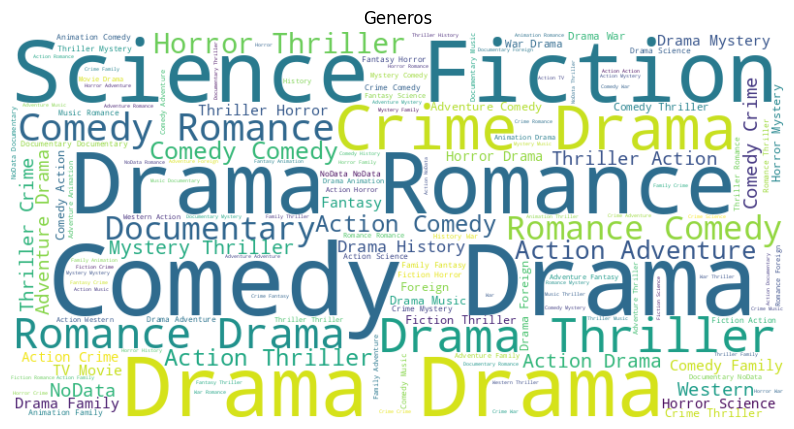

In [21]:
text = ' '.join(data['genres_clean'].tolist())

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

# Mostrar la nube de palabras usando Matplotlib
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Generos')
plt.show()

> Para el Genero de las peliculas a pesar de existir numerosos generos los que mas resaltan a la hora de hacer un analisis son el de drama, comedia y ciencia ficcion.

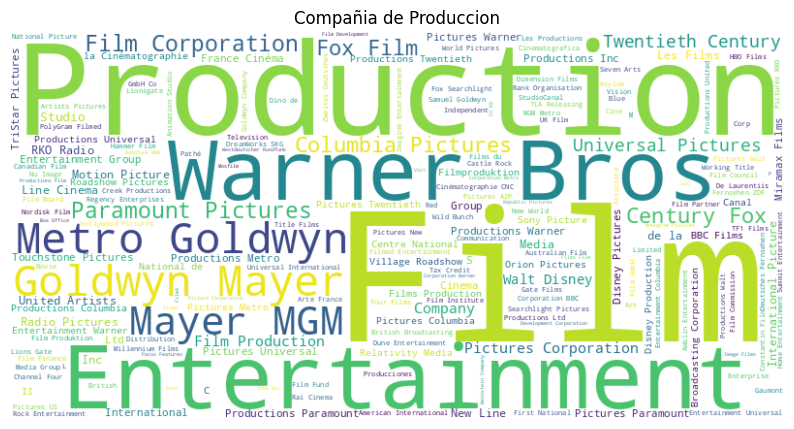

In [22]:
compañias_filtradas = data['production_companies_clean'][data['production_companies_clean'] != 'NoData']
text = ' '.join(compañias_filtradas.tolist())

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

# Mostrar la nube de palabras usando Matplotlib
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Compañia de Produccion')
plt.show()

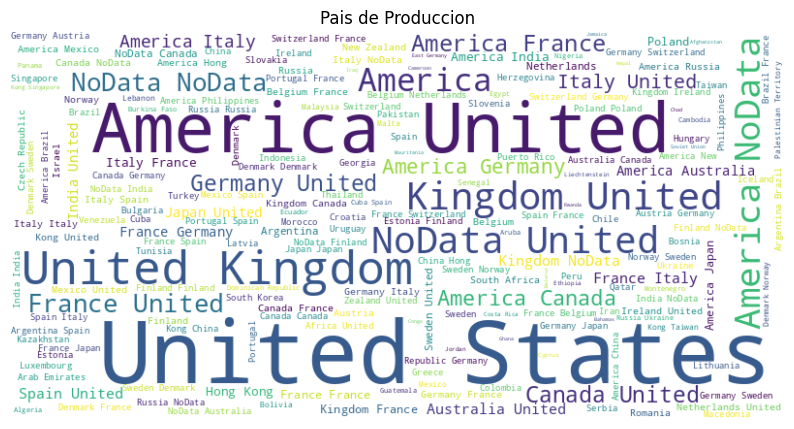

In [23]:
text = ' '.join(data['production_countries_clean'].tolist())

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

# Mostrar la nube de palabras usando Matplotlib
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Pais de Produccion')
plt.show()

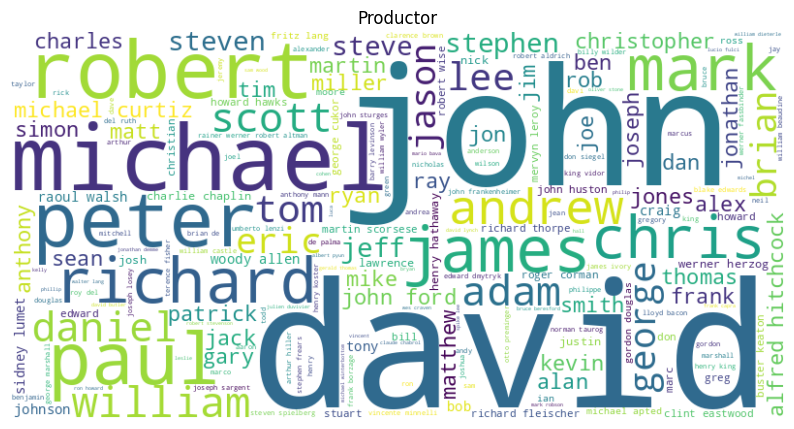

In [24]:
nombres_filtrados = data['name'][data['name'] != 'desconocido']
text = ' '.join(nombres_filtrados.tolist())

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

# Mostrar la nube de palabras usando Matplotlib
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Productor')
plt.show()

> Para el area de las productoras, los paises de produccion y el director de la pelicula se ha colocado un filtro especial, ya que con la intencion de no eliminar las columnas se decidio reemplazar los valores faltantes por valores como 'desconocido' para el lugar de las peliculas que no contaran con el directot y 'NoData' para los valores faltantes de las otras columnas, teniendo eso en cuenta se filtra para que no afecte el comportamiento de los datos durante las busquedas y los analisis, tambien se tomaran en cuenta a la hora de elaborar el modelo.

> una vez terminado el analisis y la preparacion de los datos se carga una nueva tabla en la base de datos para trabajar con el modelo.

In [25]:
data

,original_language,overview,title,genres_clean,production_companies_clean,production_countries_clean,name
0,fi,Taisto Kasurinen is a Finnish coal miner whose...,ariel,"Drama, Crime","Villealfa Filmproduction Oy, Finnish Film Foun...",Finland,desconocido
1,fi,"An episode in the life of Nikander, a garbage ...",shadows in paradise,"Drama, Comedy",Villealfa Filmproduction Oy,Finland,desconocido
2,en,It's Ted the Bellhop's first night on the job....,four rooms,"Crime, Comedy","Miramax Films, A Band Apart",United States of America,allison anders
3,en,"While racing to a boxing match, Frank, Mike, J...",judgment night,"Action, Thriller, Crime","Universal Pictures, Largo Entertainment, JVC E...","Japan, United States of America",stephen hopkins
4,en,Princess Leia is captured and held hostage by ...,star wars,"Adventure, Action, Science Fiction","Lucasfilm, Twentieth Century Fox Film Corporation",United States of America,george lucas
...,...,...,...,...,...,...,...
31943,en,"Stranded in an Arctic mine, two survivors are ...",zygote,"Horror, Science Fiction",Oats Studio,Canada,neill blomkamp
31944,en,"William Shatner sits down with scientists, inn...",the truth is in the stars,Documentary,NoData,Canada,craig thompson
31945,en,A horror comedy spoofing conspiracy theory mov...,abduction,"Fantasy, Drama",NoData,United Kingdom,molly smith
31946,en,Fifteen-year-old girl Dotty Fisher is assaulte...,tragedy in a temporary town,Drama,NoData,United States of America,sidney lumet


In [26]:
#data.to_sql('ml', engine)

<h1>Conclusion</h1>



In [27]:
# Importaciones de sklearn para el modelo de recomendacion.
import nltk
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from scipy.sparse import hstack


In [28]:

# Descargar recursos necesarios de nltk
nltk.download('punkt')
nltk.download('stopwords')


# Mostrar las primeras filas del DataFrame
print(data.head())

# Preprocesar texto
stop_words = set(stopwords.words('english'))

def preprocess(text):
    if pd.isna(text):
        return ""
    text = text.lower()
    words = word_tokenize(text)
    words = [word for word in words if word.isalnum() and word not in stop_words]
    return ' '.join(words)

# Aplicar preprocesamiento a las columnas relevantes
columns_to_preprocess = ['title', 'production_companies_clean', 'production_countries_clean', 'genres_clean', 'overview', 'name']
for column in columns_to_preprocess:
    data[f'processed_{column}'] = data[column].apply(preprocess)

# Vectorizar las columnas preprocesadas usando TF-IDF
tfidf_vectorizers = {}
tfidf_matrices = []
for column in columns_to_preprocess:
    vectorizer = TfidfVectorizer()
    tfidf_matrix = vectorizer.fit_transform(data[f'processed_{column}'])
    tfidf_vectorizers[column] = vectorizer
    tfidf_matrices.append(tfidf_matrix)

# Combinar todas las matrices TF-IDF en una sola matriz

combined_tfidf_matrix = hstack(tfidf_matrices)

# Calcular la similitud del coseno entre las películas
cosine_similarities = cosine_similarity(combined_tfidf_matrix, combined_tfidf_matrix)

def get_recommendations(title, cosine_similarities, data, top_n=5):
    # Verificar si el título existe en el DataFrame
    if title not in data['title'].values:
        return f"La película '{title}' no se encuentra en la base de datos."
    
    # Encontrar el índice de la película dada
    idx = data[data['title'] == title].index[0]
    
    # Obtener las similitudes de la película dada con todas las demás películas
    sim_scores = list(enumerate(cosine_similarities[idx]))
    
    # Ordenar las películas por similitud y seleccionar las más similares
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    
    # Obtener los índices de las películas más similares
    sim_scores = sim_scores[1:top_n+1]
    movie_indices = [i[0] for i in sim_scores]
    
    # Devolver los títulos de las películas recomendadas
    return data['title'].iloc[movie_indices]

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Rhamer\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Rhamer\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


  original_language                                           overview  \
0                fi  Taisto Kasurinen is a Finnish coal miner whose...   
1                fi  An episode in the life of Nikander, a garbage ...   
2                en  It's Ted the Bellhop's first night on the job....   
3                en  While racing to a boxing match, Frank, Mike, J...   
4                en  Princess Leia is captured and held hostage by ...   

                 title                        genres_clean  \
0                ariel                        Drama, Crime   
1  shadows in paradise                       Drama, Comedy   
2           four rooms                       Crime, Comedy   
3       judgment night             Action, Thriller, Crime   
4            star wars  Adventure, Action, Science Fiction   

                          production_companies_clean  \
0  Villealfa Filmproduction Oy, Finnish Film Foun...   
1                        Villealfa Filmproduction Oy   
2             

In [32]:
# Sistema de Recomendacion
def recommender(movie:str):
    # Ejemplo de uso: obtener recomendaciones para una película dada
    title = movie  # Cambia esto por el título de la película que desees
    recommendations = get_recommendations(title, cosine_similarities,data)
    return {
        'message':f"Recomendaciones para '{title}':\n", 
        'recommendations':recommendations
        }

In [35]:
resultado = recommender('toy story')

print(resultado)

{'message': "Recomendaciones para 'toy story':\n", 'recommendations': 534                  toy story 2
3085                 toy story 3
4837                     tin toy
4842    mater and the ghostlight
4838                 knick knack
Name: title, dtype: object}
